If you would like run the code from this notebook yourself, you will need to have ggmap (https://github.com/sjanssen2/ggmap/tree/master) installed, as well as this complimentary environment listed in the ggmap/recipes folder: env-bugbase + a QIIME2-2024.10-amplicon installation.

# Touching Surfaces

Data can be retrieved from Qiita at study ID 15175 https://qiita.ucsd.edu/study/description/15175

In [76]:
# toggle between "notebook" and "inline", if graphs are not directly displayes
%matplotlib  inline

In [83]:
%load_ext autoreload
%autoreload 2

from ggmap.workflow import *

PROJECT_PI = 'Kraemer'
PROJECT_NAME = 'TouchingSurfaces'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [84]:
prj_data = dict()

## Load metadata

In [85]:
prj_data['metadata'] = pd.read_csv('/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Caro/metadata_pub.csv', sep=";", dtype=str, na_values=['not applicable'], index_col=0) 
prj_data['metadata']

,collection_device,collection_method,collection_timestamp,env_simple,env_metal,env_surface,env_metal_surface,env_individual_samples,description,dna_extracted,...,qiita_study_id,sample_type,scientific_name,surface_location,surface_structure,surface_type,taxon_id,title,toucharray_location,tube_id
sample_name,,,,,,,,,,,,,,,,,,,,,
15175.A4ALU,Sterile Collection Swab,Surface Swab,27.01.2023,array,aluminum,Case,aluminumCase,NaN,Ground Control School Array 4- Aluminium case,TRUE,...,15175,DNA,metagenome,ground_Alu,Case,Alu,256318,TouchingSurfaces,School_4,A4ALU
15175.A4Anegswab,Sterile Collection Swab,Blank Swab,27.01.2023,NaN,swab,Swab,swab,NaN,Ground Control School Array 4- negative swab a...,TRUE,...,15175,DNA,metagenome,ground_control,Swab,NaN,256318,TouchingSurfaces,School_4_control,A4AnegswabA
15175.A4B1,Sterile Collection Swab,Surface Swab,27.01.2023,array,brass,polished,brasspolished,NaN,Ground Control School Array 4- Brass polished,TRUE,...,15175,DNA,metagenome,ground_B1,polished,B1,256318,TouchingSurfaces,School_4,A4B1
15175.A4B2a,Sterile Collection Swab,Surface Swab,27.01.2023,array,brass,3µm,brass3µm,NaN,Ground Control School Array 4- Brass 3µm,TRUE,...,15175,DNA,metagenome,ground_B2a,3µm,B2a,256318,TouchingSurfaces,School_4,A4B2a
15175.A4B2b,Sterile Collection Swab,Surface Swab,27.01.2023,array,brass,800nm,brass800nm,NaN,Ground Control School Array 4- Brass 800nm,TRUE,...,15175,DNA,metagenome,ground_B2b,800nm,B2b,256318,TouchingSurfaces,School_4,A4B2b
15175.A4C1,Sterile Collection Swab,Surface Swab,27.01.2023,array,copper,polished,copperpolished,NaN,Ground Control School Array 4- Copper polished,TRUE,...,15175,DNA,metagenome,ground_C1,polished,C1,256318,TouchingSurfaces,School_4,A4C1
15175.A4C2a,Sterile Collection Swab,Surface Swab,27.01.2023,array,copper,3µm,copper3µm,NaN,Ground Control School Array 4- Copper 3µm,TRUE,...,15175,DNA,metagenome,ground_C2a,3µm,C2a,256318,TouchingSurfaces,School_4,A4C2a
15175.A4C2b,Sterile Collection Swab,Surface Swab,27.01.2023,array,copper,800nm,copper800nm,NaN,Ground Control School Array 4- Copper 800nm,TRUE,...,15175,DNA,metagenome,ground_C2b,800nm,C2b,256318,TouchingSurfaces,School_4,A4C2b
15175.A4S1,Sterile Collection Swab,Surface Swab,27.01.2023,array,steel,polished,steelpolished,NaN,Ground Control School Array 4- Stainless Steel...,TRUE,...,15175,DNA,metagenome,ground_S1,polished,S1,256318,TouchingSurfaces,School_4,A4S1


Metadata

# Process data
## Initiate new project

In [88]:
prj_data = init_project(pi=PROJECT_PI, name=PROJECT_NAME, prj_data=prj_data, force=True)

  /vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/tmp_workdir_ckraemer/no_backup


## Rarefaction + Diversity + Emperor

You have to run the below function at least twice: 
 - First, to get rarefaction curves, which you will use to determine a rarefaction depth for samples to compute diversity values
 - Second, alpha- beta- and emperor computation need ONE specific `rarefaction_depth` value, which you have determined in step 1

In [89]:
prj_data['paths']['deblur_table'] = '/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Caro/179191_reference-hit.biom'
prj_data['paths']['insertion_tree'] = '/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Caro/179191_insertion_tree.relabelled.tre'
prj_data['insertion_tree'] = TreeNode.read(prj_data['paths']['insertion_tree'], format='newick')

Information: 1717 of 2910 features have been removed from your Deblur table, since they have less than 10 read counts in all samples combined.
Using existing results from '.anacache/50a90dac0442ae99a307f65ca2b6acf3.taxRDP'. 
Using existing results from '.anacache/88ea85596eaa52c7e9f90baad8848441.taxRDP'. 
Information: You are loosing a significant amount of reads due to filtration of plant material!
15175.A9B1     0.237120
15175.A9S2b    0.186144
15175.A9ALU    0.185209
15175.A7C2b    0.168262
15175.W5ALU    0.148529
15175.A7C1     0.143160
15175.A7ALU    0.102781
15175.A9C1     0.100559
15175.A9C2b    0.057707
15175.A9S1     0.054312
dtype: float64
In total, 5833 reads (1.738952%) have been filtered for chloroplast/mitochondia removal.
Reduced to 96 samples (feature-table had 100, metadata had 96 samples)
Using existing results from '.anacache/299fd715d09166e9a014c5f031fcf713.decontam'. 
  loosing 120 of 1163 = 10.32% features
  loosing 45960 of 326347 = 14.08% reads


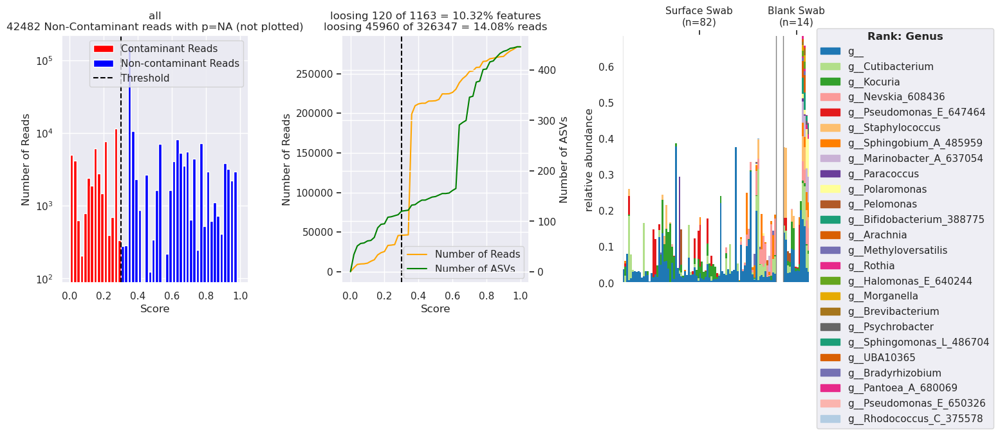

Using existing results from '.anacache/4105a8061110e7c13a4b7fc7ca6add50.rare'. 


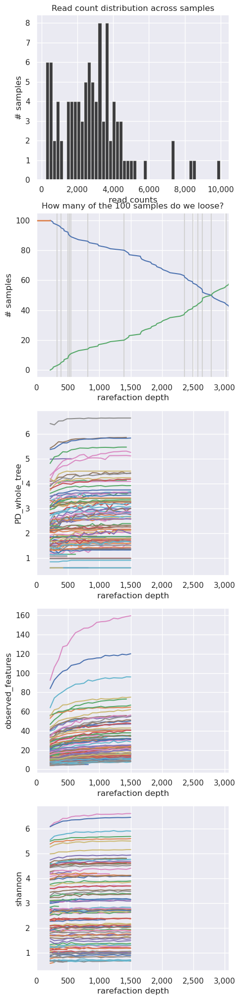

Using existing results from '.anacache/7c64760ef25a998b26a344bc8d5bed0f.rarefy'. 
Using existing results from '.anacache/3625f080968ba0056e7d3a3e34e07996.adiv'. 
Using existing results from '.anacache/4f18fccca25f8e87f8146f91e6f68e19.bdiv'. 
Using existing results from '.anacache/112af430a843d86e4ed396e4429860e7.emperor'. 
Working directory is '/homes/ckraemer/TMP/ana_bugbase_glv4p_n2', cachefile is '.anacache/5fb12619b02751fb096ada5cbc8c91dc.bugbase'. Now wait until 25640500 job finishes.
Your final feature table is composed of 86 samples and 1007 features.


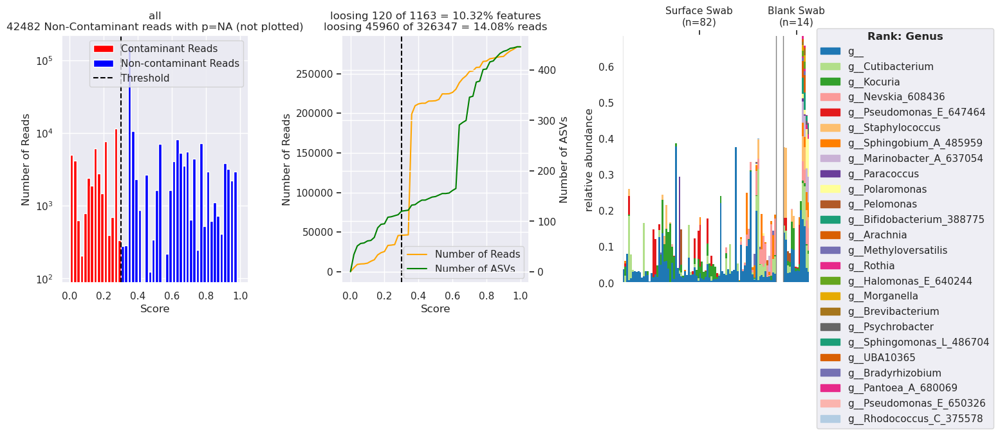

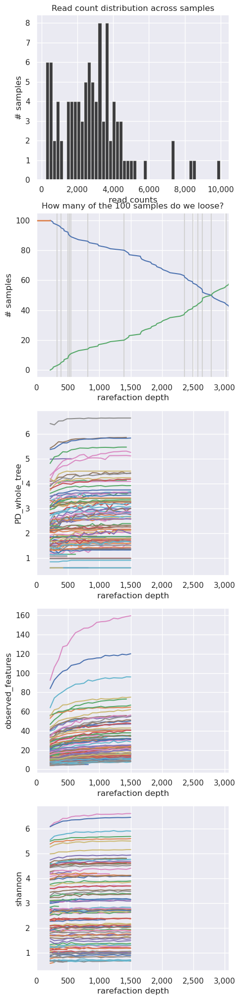

In [90]:
prj_data['metadata']['collection_method'] = prj_data['metadata']['collection_method'].replace('Surface swab', 'Surface Swab')

idx_control_samples = set(prj_data['metadata'][prj_data['metadata']['collection_method'].isin(['not applicable', 'Blank Swab'])].index)
res_all = process_study(
    metadata=prj_data['metadata'],
    control_samples=idx_control_samples,
    fp_deblur_biom=prj_data['paths']['deblur_table'],
    fp_insertiontree=prj_data['paths']['insertion_tree'],
    rarefaction_depth=750,
    rarefaction_min_depth=10,
    rarefaction_max_depth=1500,
    fp_taxonomy_trained_classifier='/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/2022.10.backbone.full-length.nb.sklearn-1.4.2.qza',
    #fp_taxonomy_trained_classifier='/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Caro/gg_2022_10_backbone_full_length.nb.qza',
    fp_taxonomy_trained_classifier_gg138_chloroMitoRemoval='/vol/jlab/MicrobiomeAnalyses/References/Q2-Naive_Bayes_classifiers/gg-13-8-99-nb-classifier_2022.11.qza',
    tree_insert=prj_data['insertion_tree'],
    is_v4_region=False,
    emperor_fp='/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Caro/Generated/Emperor',
    emperor_infix='_deblur_',
    dry=False,
    use_grid=True,
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call

    fp_closedref_biom="/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Caro/FromQiita/196131_otu_table.biom",

    decontam_col_concentration=None,
    decontam_col_sampletype='collection_method',
    decontam_name_control_sample="Blank Swab",
    decontam_lowbiomass_envs=['Surface Swab'],
    decontam_cols_batch=[],
    decontam_threshold=0.3,
)

### stratify rarefaction curves by metadata

Using existing results from '.anacache/8db04b6bcc654b5995430b61d0c6bdac.rare'. 


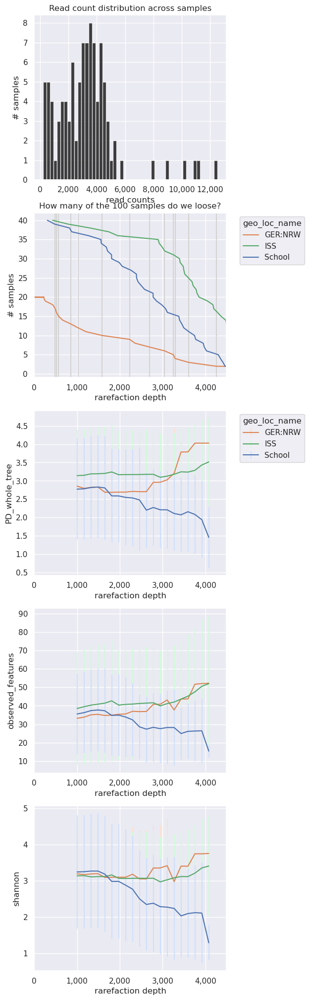

In [91]:
_ = rarefaction_curves(
    res_all['counts_plantsremoved'], 
    reference_tree=prj_data['paths']['insertion_tree'], 
    control_sample_names=idx_control_samples, 
    fix_zero_len_branches=False, # since this has already been corrected via the project_sepp call
    sample_grouping=prj_data['metadata']["geo_loc_name"], 
    dry=False)

# Explore Data

## Taxonomy Barplot

In [16]:
res_all['counts_decontaminated']

,15175.A4ALU,15175.A4Anegswab,15175.A4B1,15175.A4B2a,15175.A4B2b,15175.A4C1,15175.A4C2a,15175.A4C2b,15175.A4S1,15175.A4S2a,...,15175.W5B1,15175.W5B2a,15175.W5B2b,15175.W5C1,15175.W5C2a,15175.W5C2b,15175.W5S1,15175.W5S2a,15175.W5S2b,15175.W5negswab
AACGAACGCTGGCGGAAGGCTTAACACATGCAAGTCGAGCGCACCCTTCGGGGTGAGCGGCAGACGGGTGAGTAACGCGTGGGAACGTACCCTTTGGTTCGGAATAGCCCTTGGAAACGAGGAGTAATGCCGAATAAGCCCTACGGGGGA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AACGAACGCTGGCGGCAGGCCTAACACATGCAAGTCGAACGAAGCCTTCGGGCTTAGTGGCGGACGGGTTAGTAACGCGTGGGAATGTACCCTTCACTACGGAATAGTCCCGGGAAACTGGGTTTAATACCGTATACGCCCTTCGGGGGA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AACGAACGCTGGCGGCAGGCCTAACACATGCAAGTCGAACGAAGCCTTCGGGCTTAGTGGCGGACGGGTTAGTAACGCGTGGGAATGTACCCTTCACTACGGAATAGTCCCGGGAAGCTGGGTTTAATACCGTATACGCCCTTCGGGGGA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AACGAACGCTGGCGGCAGGCCTAACACATGCAAGTCGAGCGAGATCTTCGGGTCTAGCGGCGGACGGGTGAGTAACGCGTGGGAATATGCCCTTCTCTACGGAATAGCCTCGGGAAACTGGGAGTAATACCGTATACGCCCTTTGGGGGA,0,0,0,0,0,0,0,0,0,0,...,0,29,0,0,0,0,0,0,0,0
AACGAACGCTGGCGGCAGGCCTAACACATGCAAGTCGAGCGAGGACTTCGGTTCTAGCGGCGGACGGGTGAGTAACGCGTGGGAATGTGCCCTTCTCTACGGAATAGCCCTGGGAAACTGGGAGTAATACCGTATACGCCCTATTGGGGA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGGTTTGATTCTGGCTCAGGATGAACGCTGGCGGCGTGCCTAATACATGCAAGTCGAGCGAACGGACGAGAAGCTTGCTTCTCTGATGTTAGCGGCGGACGGGTGAGTAACACGTGGATAACCTACCTATAAGACTGGGATAACTTCGGG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GGGTTTGATTCTGGCTCAGGATGAACGCTGGCGGCGTGCTTAACACATGCAAGTCGAACGGAAAGGCCCAAGCTTGCTTGGGTACTCGAGTGGCGAACGGGTGAGTAACACGTGGGTGATCTGCCCTGCACTTCGGGATAAGCCTGGGAA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GGTGAACGCTGGCGGCGTGCTTAAGACATGCAAGTCGAACGCACTCTTTCGGGAGTGAGTGGCGCACGGGTGAGTAATGCATAACTGACGTACCGGGAACTCCGGGATAACCAGCCGAAAGGCTGGCTAATACCGGATGTGCAGCACTGT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
GGTGAACGCTGGCGGCGTGCTTAAGACATGCAAGTCGAACGCGGTCTTCGGACCGAGTGGCGCACGGGTGAGTAACACGTAACTGACCTACCCAGAAGTCACGAATAACTGGCCGAAAGGTCCGCTAATACGTGATGTGGTGATGCACCG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Figure 6- Bacterial communities on the different surfaces in respect to their location during the experiment

93 taxa left after collapsing to Family.
86 samples left with metadata and counts.
46 taxa left after filtering low abundant.
raw counts: 86
raw meta: 100
meta with counts: 86 samples x 40 fields
counts with meta: 86


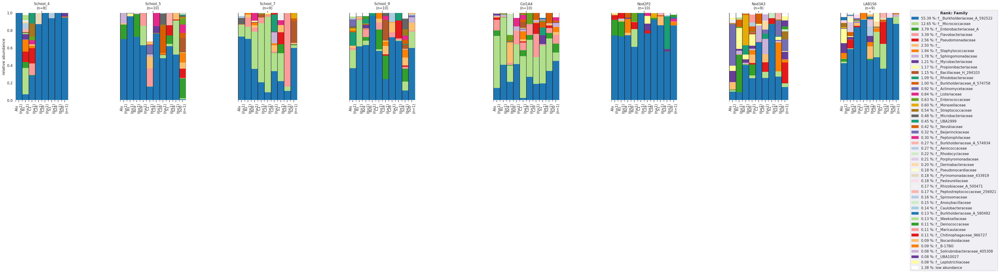

In [92]:
#Decontaminated + rarefied:
p = plotTaxonomy(res_all['rarefaction']['results'], prj_data['metadata'], file_taxonomy=res_all['taxonomy']['RDP']['results']['Taxon'],
                 group_l1='toucharray_location', 
                 group_l2='surface_type',
                 rank='Family',
                 print_sample_labels=False,
                print_meanrelabunances=True)
p[0].set_size_inches((50, 5))

### Figure 7-Relative abundance of bacteria on species level

78 taxa left after collapsing to Species.
86 samples left with metadata and counts.
19 taxa left after filtering low abundant.
raw counts: 86
raw meta: 100
meta with counts: 86 samples x 40 fields
counts with meta: 86


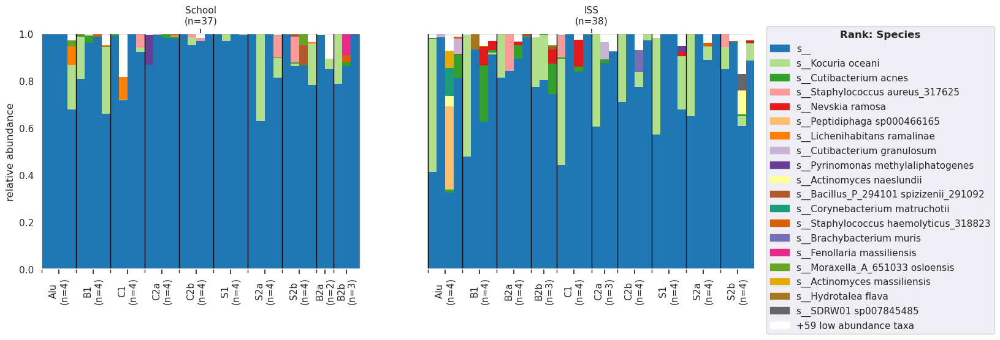

In [95]:
#Decontaminated + rarefied
p = plotTaxonomy(res_all['rarefaction']['results'], prj_data['metadata'], file_taxonomy=res_all['taxonomy']['RDP']['results']['Taxon'],
                 group_l1='geo_loc_name', 
                 group_l2='surface_type',
                 rank='Species',
                 print_sample_labels=False)
p[0].set_size_inches((15, 5))

### Supplementary Figure 12- Relative abundance on family level of blank swabs (control)

93 taxa left after collapsing to Family.
10 samples left with metadata and counts.
4 taxa left after filtering low abundant.
raw counts: 86
raw meta: 16
meta with counts: 10 samples x 40 fields
counts with meta: 10


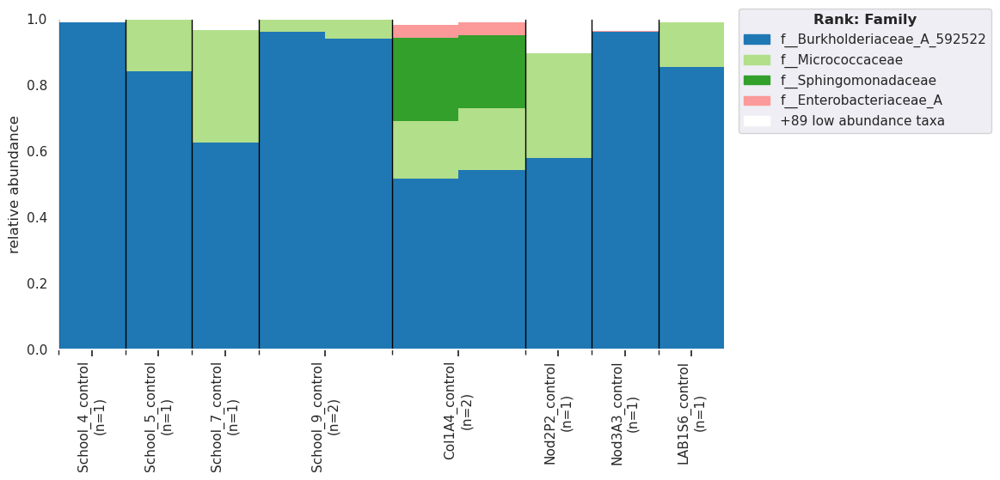

In [93]:
p = plotTaxonomy(res_all['rarefaction']['results'], prj_data['metadata'][prj_data['metadata']['env_metal'].isin(['swab'])], file_taxonomy=res_all['taxonomy']['RDP']['results']['Taxon'],
                 group_l1='geo_loc_name', 
                 group_l2='toucharray_location',
                 rank='Family',
                 print_sample_labels=False)
p[0].set_size_inches((10, 5))

## Diversity Measures

In [26]:
res_all['alpha_diversity']['results']

,observed_features,PD_whole_tree,shannon
iter10_depth750,,,
15175.A4ALU,5.0,0.604042,0.662810
15175.A4B1,44.9,4.129607,4.577332
15175.A4C1,29.6,3.262090,3.503622
15175.A4C2a,11.6,1.356567,1.267106
15175.A4C2b,6.0,0.604048,0.674016
...,...,...,...
15175.W5C2b,20.9,3.014244,2.739841
15175.W5S1,19.5,2.749049,2.780233
15175.W5S2a,13.6,1.759354,1.025866


In [27]:
pd.set_option("display.max_rows",500)

In [ ]:
import itertools  

### Supplementary Table 5- ISS & Schools

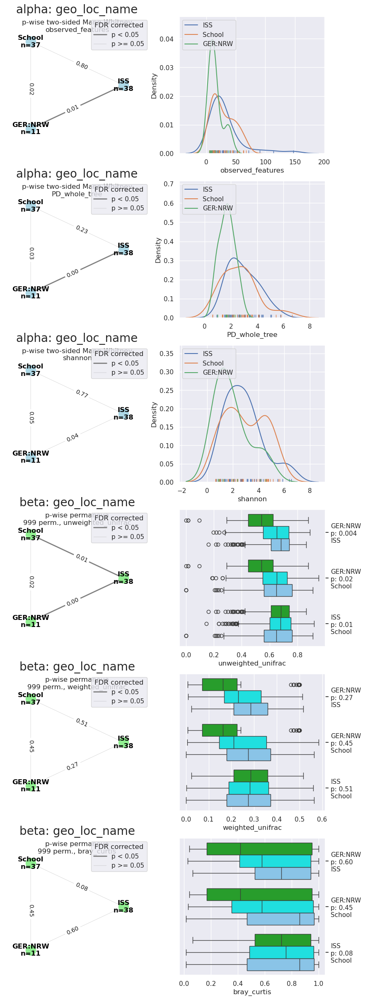

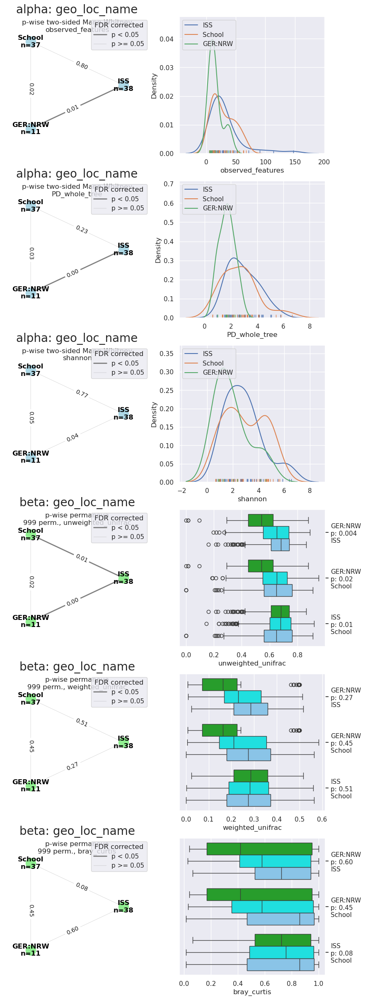

In [96]:
_ = plotNetworks('geo_loc_name', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=1)
_

In [29]:
 x = plotNetworks('geo_loc_name', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=1, b_min_num=1, summarize=True)
x[0]

,group name,diversity,metric,group x,group y,p-value,test-statistic,num samples x,num samples y,avgdist,test name,min_group_size,num_permutations
3,geo_loc_name,alpha,PD_whole_tree,GER:NRW,ISS,0.001380,75.000000,11,38,NaN,mannwhitneyu,1,NaN
4,geo_loc_name,alpha,PD_whole_tree,GER:NRW,School,0.034895,117.000000,11,37,NaN,mannwhitneyu,1,NaN
5,geo_loc_name,alpha,PD_whole_tree,ISS,School,0.229061,817.000000,38,37,NaN,mannwhitneyu,1,NaN
0,geo_loc_name,alpha,observed_features,GER:NRW,ISS,0.007018,96.000000,11,38,NaN,mannwhitneyu,1,NaN
1,geo_loc_name,alpha,observed_features,GER:NRW,School,0.022521,110.000000,11,37,NaN,mannwhitneyu,1,NaN
2,geo_loc_name,alpha,observed_features,ISS,School,0.795138,728.000000,38,37,NaN,mannwhitneyu,1,NaN
6,geo_loc_name,alpha,shannon,GER:NRW,ISS,0.040489,123.000000,11,38,NaN,mannwhitneyu,1,NaN
7,geo_loc_name,alpha,shannon,GER:NRW,School,0.052640,124.000000,11,37,NaN,mannwhitneyu,1,NaN
8,geo_loc_name,alpha,shannon,ISS,School,0.770728,675.000000,38,37,NaN,mannwhitneyu,1,NaN
15,geo_loc_name,beta,bray_curtis,GER:NRW,ISS,0.629000,0.761507,11,38,0.605021,permanova,1,999.0


In [30]:
#import itertools  

a = list(x[0][x[0]['diversity'].isin(['alpha'])]['group x'].unique())
b = list(x[0][x[0]['diversity'].isin(['alpha'])]['group y'].unique())
res = list(set(a+b))
c = list(combinations(res, 2))
print(c)
print(len(c))

[('School', 'GER:NRW'), ('School', 'ISS'), ('GER:NRW', 'ISS')]
3


### Supplementary Table 6- Touch Array Location

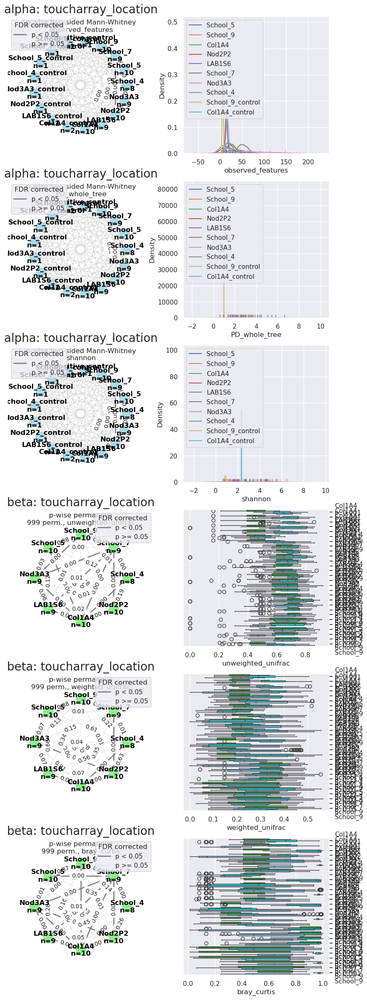

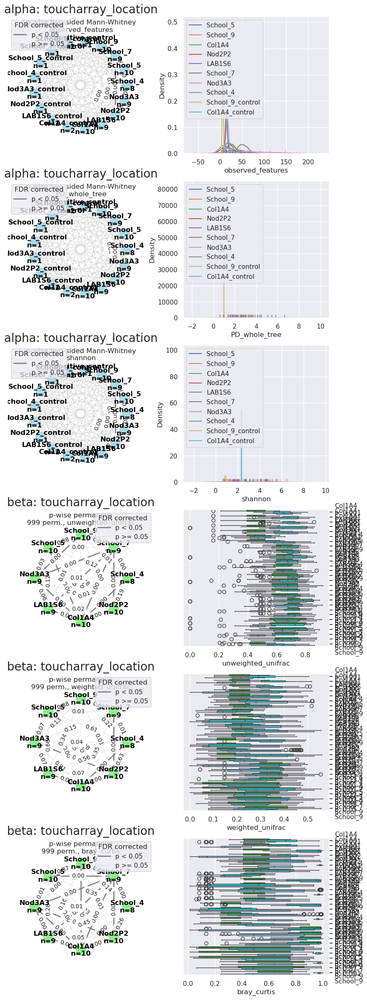

In [97]:
_ = plotNetworks('toucharray_location', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=1)
_

In [32]:
x = plotNetworks('toucharray_location', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=3, summarize=True, b_min_num=3)
x[0]

,group name,diversity,metric,group x,group y,p-value,test-statistic,num samples x,num samples y,avgdist,test name,min_group_size,num_permutations
28,toucharray_location,alpha,PD_whole_tree,Col1A4,LAB1S6,0.713303,50.000000,10,9,NaN,mannwhitneyu,3,NaN
29,toucharray_location,alpha,PD_whole_tree,Col1A4,Nod2P2,0.000183,100.000000,10,10,NaN,mannwhitneyu,3,NaN
30,toucharray_location,alpha,PD_whole_tree,Col1A4,Nod3A3,0.391267,34.000000,10,9,NaN,mannwhitneyu,3,NaN
31,toucharray_location,alpha,PD_whole_tree,Col1A4,School_4,0.015540,67.000000,10,8,NaN,mannwhitneyu,3,NaN
32,toucharray_location,alpha,PD_whole_tree,Col1A4,School_5,0.064022,75.000000,10,10,NaN,mannwhitneyu,3,NaN
33,toucharray_location,alpha,PD_whole_tree,Col1A4,School_7,0.487668,54.000000,10,9,NaN,mannwhitneyu,3,NaN
34,toucharray_location,alpha,PD_whole_tree,Col1A4,School_9,0.850107,53.000000,10,10,NaN,mannwhitneyu,3,NaN
35,toucharray_location,alpha,PD_whole_tree,LAB1S6,Nod2P2,0.030486,72.000000,9,10,NaN,mannwhitneyu,3,NaN
36,toucharray_location,alpha,PD_whole_tree,LAB1S6,Nod3A3,0.111961,22.000000,9,9,NaN,mannwhitneyu,3,NaN
37,toucharray_location,alpha,PD_whole_tree,LAB1S6,School_4,0.027396,59.000000,9,8,NaN,mannwhitneyu,3,NaN


In [33]:
#import itertools  

a = list(x[0][x[0]['diversity'].isin(['alpha'])]['group x'].unique())
b = list(x[0][x[0]['diversity'].isin(['alpha'])]['group y'].unique())
res = list(set(a+b))
c = list(combinations(res, 2))
print(c)
print(len(c))

[('School_4', 'School_7'), ('School_4', 'Nod3A3'), ('School_4', 'Col1A4'), ('School_4', 'School_5'), ('School_4', 'Nod2P2'), ('School_4', 'School_9'), ('School_4', 'LAB1S6'), ('School_7', 'Nod3A3'), ('School_7', 'Col1A4'), ('School_7', 'School_5'), ('School_7', 'Nod2P2'), ('School_7', 'School_9'), ('School_7', 'LAB1S6'), ('Nod3A3', 'Col1A4'), ('Nod3A3', 'School_5'), ('Nod3A3', 'Nod2P2'), ('Nod3A3', 'School_9'), ('Nod3A3', 'LAB1S6'), ('Col1A4', 'School_5'), ('Col1A4', 'Nod2P2'), ('Col1A4', 'School_9'), ('Col1A4', 'LAB1S6'), ('School_5', 'Nod2P2'), ('School_5', 'School_9'), ('School_5', 'LAB1S6'), ('Nod2P2', 'School_9'), ('Nod2P2', 'LAB1S6'), ('School_9', 'LAB1S6')]
28


School_4= School-A, School_5=School-B, School_7=School-C, School_9=School-D

### Supplementary Table 7- wControl (Experiment type)

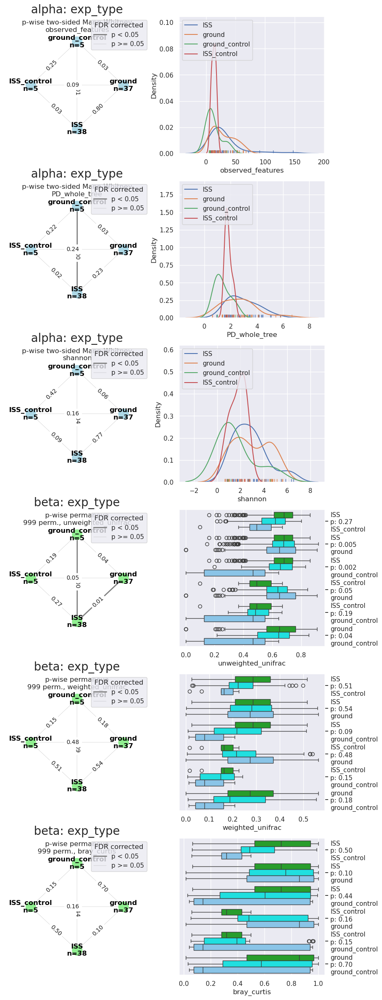

In [98]:
_ = plotNetworks('exp_type', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=1)

In [37]:
x = plotNetworks('exp_type', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=1, summarize= True, b_min_num=1)
x[0]

,group name,diversity,metric,group x,group y,p-value,test-statistic,num samples x,num samples y,avgdist,test name,min_group_size,num_permutations
6,exp_type,alpha,PD_whole_tree,ISS,ISS_control,0.018361,156.000000,38,5,NaN,mannwhitneyu,1,NaN
7,exp_type,alpha,PD_whole_tree,ISS,ground,0.229061,817.000000,38,37,NaN,mannwhitneyu,1,NaN
8,exp_type,alpha,PD_whole_tree,ISS,ground_control,0.002797,169.000000,38,5,NaN,mannwhitneyu,1,NaN
9,exp_type,alpha,PD_whole_tree,ISS_control,ground,0.236645,61.000000,5,37,NaN,mannwhitneyu,1,NaN
10,exp_type,alpha,PD_whole_tree,ISS_control,ground_control,0.222222,19.000000,5,5,NaN,mannwhitneyu,1,NaN
11,exp_type,alpha,PD_whole_tree,ground,ground_control,0.029436,148.000000,37,5,NaN,mannwhitneyu,1,NaN
0,exp_type,alpha,observed_features,ISS,ISS_control,0.026649,154.000000,38,5,NaN,mannwhitneyu,1,NaN
1,exp_type,alpha,observed_features,ISS,ground,0.795138,728.000000,38,37,NaN,mannwhitneyu,1,NaN
2,exp_type,alpha,observed_features,ISS,ground_control,0.014527,160.000000,38,5,NaN,mannwhitneyu,1,NaN
3,exp_type,alpha,observed_features,ISS_control,ground,0.094875,49.000000,5,37,NaN,mannwhitneyu,1,NaN


In [38]:
a = list(x[0][x[0]['diversity'].isin(['alpha'])]['group x'].unique())
b = list(x[0][x[0]['diversity'].isin(['alpha'])]['group y'].unique())
res = list(set(a+b))
c = list(combinations(res, 2))
print(c)
print(len(c))

[('ground', 'ground_control'), ('ground', 'ISS'), ('ground', 'ISS_control'), ('ground_control', 'ISS'), ('ground_control', 'ISS_control'), ('ISS', 'ISS_control')]
6


### Supplementary Table 8- Surface type

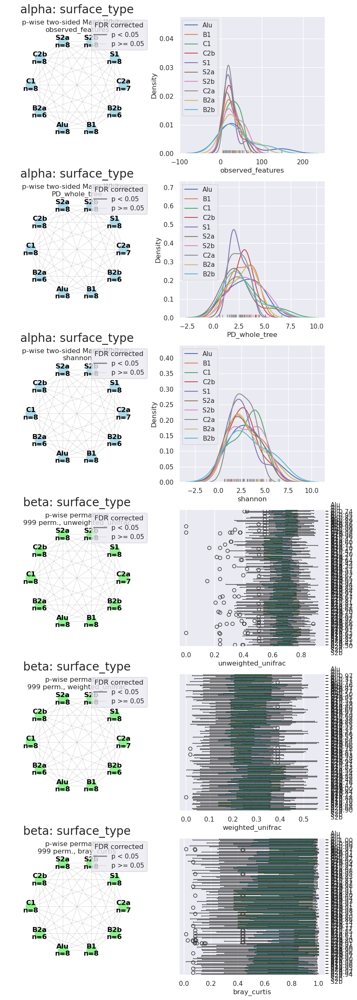

In [99]:
_ = plotNetworks('surface_type', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=3)

In [44]:
x= plotNetworks('surface_type', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=1, summarize= True, b_min_num=1)
x[0]

,group name,diversity,metric,group x,group y,p-value,test-statistic,num samples x,num samples y,avgdist,test name,min_group_size,num_permutations
45,surface_type,alpha,PD_whole_tree,Alu,B1,0.798446,35.000000,8,8,NaN,mannwhitneyu,1,NaN
46,surface_type,alpha,PD_whole_tree,Alu,B2a,0.851815,26.000000,8,6,NaN,mannwhitneyu,1,NaN
47,surface_type,alpha,PD_whole_tree,Alu,B2b,0.662005,28.000000,8,6,NaN,mannwhitneyu,1,NaN
48,surface_type,alpha,PD_whole_tree,Alu,C1,0.798446,35.000000,8,8,NaN,mannwhitneyu,1,NaN
49,surface_type,alpha,PD_whole_tree,Alu,C2a,0.396892,36.000000,8,7,NaN,mannwhitneyu,1,NaN
50,surface_type,alpha,PD_whole_tree,Alu,C2b,0.720901,36.000000,8,8,NaN,mannwhitneyu,1,NaN
51,surface_type,alpha,PD_whole_tree,Alu,S1,0.441803,40.000000,8,8,NaN,mannwhitneyu,1,NaN
52,surface_type,alpha,PD_whole_tree,Alu,S2a,0.382284,41.000000,8,8,NaN,mannwhitneyu,1,NaN
53,surface_type,alpha,PD_whole_tree,Alu,S2b,0.798446,29.000000,8,8,NaN,mannwhitneyu,1,NaN
54,surface_type,alpha,PD_whole_tree,B1,B2a,0.949717,25.000000,8,6,NaN,mannwhitneyu,1,NaN


In [45]:
a = list(x[0][x[0]['diversity'].isin(['alpha'])]['group x'].unique())
b = list(x[0][x[0]['diversity'].isin(['alpha'])]['group y'].unique())
res = list(set(a+b))
c = list(combinations(res, 2))
print(c)
print(len(c))

[('C1', 'B2a'), ('C1', 'B2b'), ('C1', 'C2a'), ('C1', 'C2b'), ('C1', 'S2b'), ('C1', 'S2a'), ('C1', 'B1'), ('C1', 'Alu'), ('C1', 'S1'), ('B2a', 'B2b'), ('B2a', 'C2a'), ('B2a', 'C2b'), ('B2a', 'S2b'), ('B2a', 'S2a'), ('B2a', 'B1'), ('B2a', 'Alu'), ('B2a', 'S1'), ('B2b', 'C2a'), ('B2b', 'C2b'), ('B2b', 'S2b'), ('B2b', 'S2a'), ('B2b', 'B1'), ('B2b', 'Alu'), ('B2b', 'S1'), ('C2a', 'C2b'), ('C2a', 'S2b'), ('C2a', 'S2a'), ('C2a', 'B1'), ('C2a', 'Alu'), ('C2a', 'S1'), ('C2b', 'S2b'), ('C2b', 'S2a'), ('C2b', 'B1'), ('C2b', 'Alu'), ('C2b', 'S1'), ('S2b', 'S2a'), ('S2b', 'B1'), ('S2b', 'Alu'), ('S2b', 'S1'), ('S2a', 'B1'), ('S2a', 'Alu'), ('S2a', 'S1'), ('B1', 'Alu'), ('B1', 'S1'), ('Alu', 'S1')]
45


### Supplementary Table 9- Topography

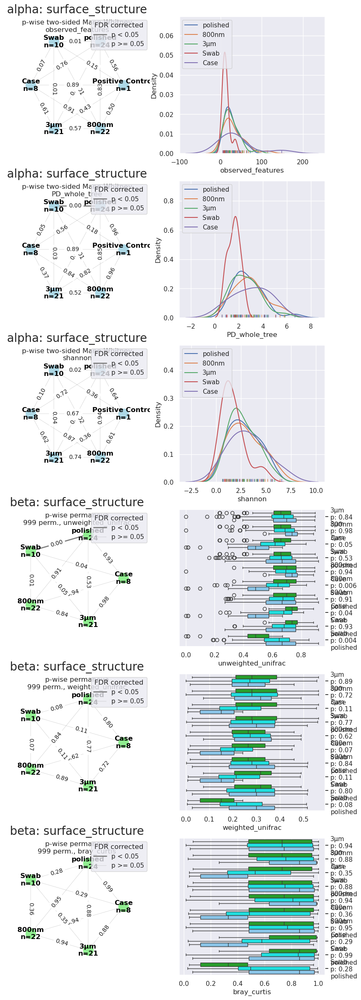

In [40]:
_ = plotNetworks('surface_structure', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=1)

In [41]:
x= plotNetworks('surface_structure', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=3, summarize= True, b_min_num=3)
x[0]

,group name,diversity,metric,group x,group y,p-value,test-statistic,num samples x,num samples y,avgdist,test name,min_group_size,num_permutations
10,surface_structure,alpha,PD_whole_tree,3µm,800nm,0.519668,204.000000,21,22,NaN,mannwhitneyu,3,NaN
11,surface_structure,alpha,PD_whole_tree,3µm,Case,0.374216,65.000000,21,8,NaN,mannwhitneyu,3,NaN
12,surface_structure,alpha,PD_whole_tree,3µm,Swab,0.032842,156.000000,21,10,NaN,mannwhitneyu,3,NaN
13,surface_structure,alpha,PD_whole_tree,3µm,polished,0.445970,218.000000,21,24,NaN,mannwhitneyu,3,NaN
14,surface_structure,alpha,PD_whole_tree,800nm,Case,0.836239,83.000000,22,8,NaN,mannwhitneyu,3,NaN
15,surface_structure,alpha,PD_whole_tree,800nm,Swab,0.006065,178.000000,22,10,NaN,mannwhitneyu,3,NaN
16,surface_structure,alpha,PD_whole_tree,800nm,polished,0.851727,273.000000,22,24,NaN,mannwhitneyu,3,NaN
17,surface_structure,alpha,PD_whole_tree,Case,Swab,0.054527,62.000000,8,10,NaN,mannwhitneyu,3,NaN
18,surface_structure,alpha,PD_whole_tree,Case,polished,0.564131,110.000000,8,24,NaN,mannwhitneyu,3,NaN
19,surface_structure,alpha,PD_whole_tree,Swab,polished,0.002345,39.000000,10,24,NaN,mannwhitneyu,3,NaN


In [42]:
a = list(x[0][x[0]['diversity'].isin(['alpha'])]['group x'].unique())
b = list(x[0][x[0]['diversity'].isin(['alpha'])]['group y'].unique())
res = list(set(a+b))
c = list(combinations(res, 2))
print(c)
print(len(c))

[('Swab', 'Case'), ('Swab', '3µm'), ('Swab', 'polished'), ('Swab', '800nm'), ('Case', '3µm'), ('Case', 'polished'), ('Case', '800nm'), ('3µm', 'polished'), ('3µm', '800nm'), ('polished', '800nm')]
10


### Supplementary Table 10- Metal

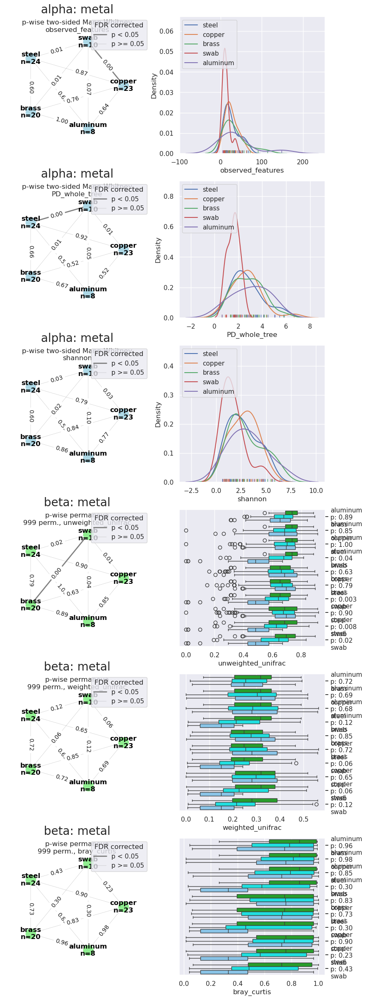

In [100]:
_ = plotNetworks('metal', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=3)

In [47]:
x= plotNetworks('metal', prj_data['metadata'], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=3, summarize= True, b_min_num=3)
x[0]

,group name,diversity,metric,group x,group y,p-value,test-statistic,num samples x,num samples y,avgdist,test name,min_group_size,num_permutations
10,metal,alpha,PD_whole_tree,aluminum,brass,0.671826,89.000000,8,20,NaN,mannwhitneyu,3,NaN
11,metal,alpha,PD_whole_tree,aluminum,copper,0.520318,107.000000,8,23,NaN,mannwhitneyu,3,NaN
12,metal,alpha,PD_whole_tree,aluminum,steel,0.564131,110.000000,8,24,NaN,mannwhitneyu,3,NaN
13,metal,alpha,PD_whole_tree,aluminum,swab,0.054527,62.000000,8,10,NaN,mannwhitneyu,3,NaN
14,metal,alpha,PD_whole_tree,brass,copper,0.518762,257.000000,20,23,NaN,mannwhitneyu,3,NaN
15,metal,alpha,PD_whole_tree,brass,steel,0.662801,259.000000,20,24,NaN,mannwhitneyu,3,NaN
16,metal,alpha,PD_whole_tree,brass,swab,0.008854,160.000000,20,10,NaN,mannwhitneyu,3,NaN
17,metal,alpha,PD_whole_tree,copper,steel,0.923706,281.000000,23,24,NaN,mannwhitneyu,3,NaN
18,metal,alpha,PD_whole_tree,copper,swab,0.012865,179.000000,23,10,NaN,mannwhitneyu,3,NaN
19,metal,alpha,PD_whole_tree,steel,swab,0.004322,196.000000,24,10,NaN,mannwhitneyu,3,NaN


In [48]:
a = list(x[0][x[0]['diversity'].isin(['alpha'])]['group x'].unique())
b = list(x[0][x[0]['diversity'].isin(['alpha'])]['group y'].unique())
res = list(set(a+b))
c = list(combinations(res, 2))
print(c)
print(len(c))

[('aluminum', 'copper'), ('aluminum', 'swab'), ('aluminum', 'brass'), ('aluminum', 'steel'), ('copper', 'swab'), ('copper', 'brass'), ('copper', 'steel'), ('swab', 'brass'), ('swab', 'steel'), ('brass', 'steel')]
10


### Supplementary Table 11 and Supplementary Figure 11-Populated Areas

In [61]:
conditions = [
    (prj_data['metadata']['toucharray_location'].isin(["Nod3A3"])),
    (prj_data['metadata']['toucharray_location'].isin(["LAB1S6","Col1A4"])),
   # (prj_data['metadata']['toucharray_location'].isin(["Col1A4"])),
    (prj_data['metadata']['toucharray_location'].isin(["Nod2P2"])),
    (prj_data['metadata']['toucharray_location'].isin(["School_4","School_5","School_7","School_9"]))
]

values = ["Node_Tranquility_Sportfacilty", "Labs", "Node_Harmony_connectingmodule", "School"] #"Labs_Columbus", 

prj_data['metadata']['populated_groups']= np.select(conditions, values, None)

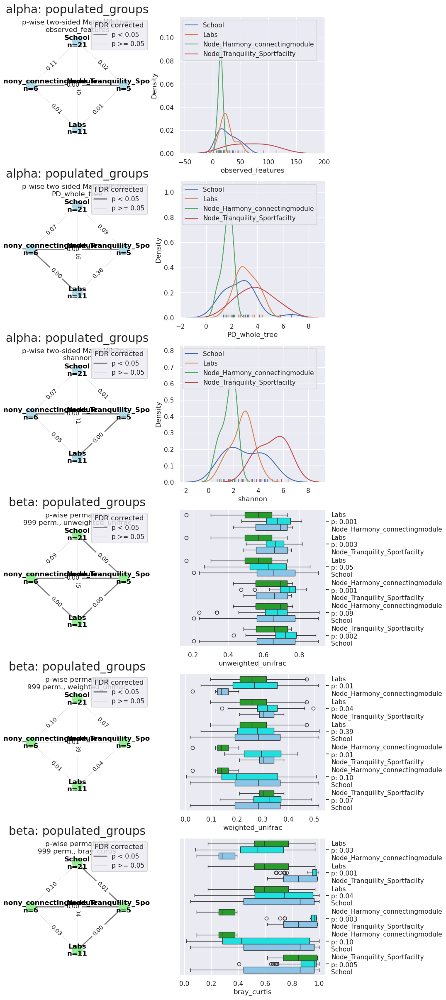

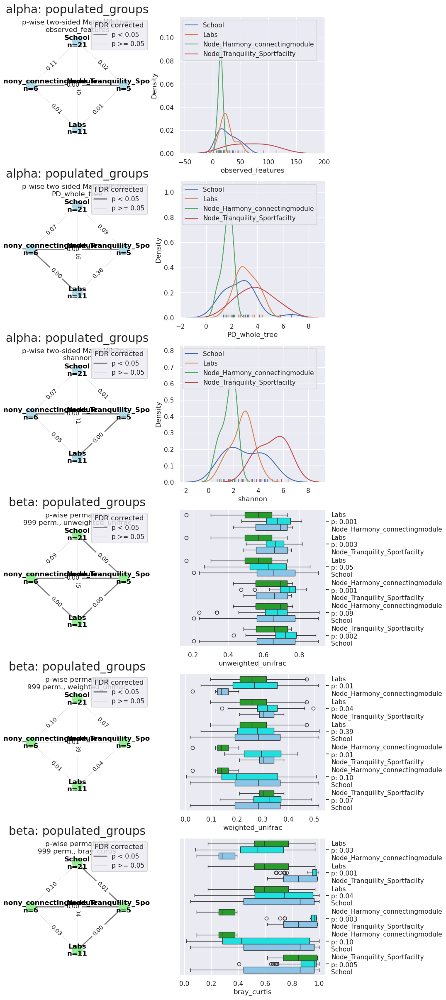

In [62]:
x = plotNetworks('populated_groups', prj_data['metadata'][prj_data['metadata']['metal'].isin(['copper','brass'])], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=1, b_min_num=1)#, summarize=True)
x

In [63]:
x = plotNetworks('populated_groups', prj_data['metadata'][prj_data['metadata']['metal'].isin(['copper','brass'])], res_all['alpha_diversity']['results'], res_all['beta_diversity']['results'], minnumalpha=1, b_min_num=1, summarize=True)
x[0]
#plt.savefig('/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Anna/Generated' + f"/alpha_beta_populated_areas.svg", transparent=False, bbox_inches='tight')

,group name,diversity,metric,group x,group y,p-value,test-statistic,num samples x,num samples y,avgdist,test name,min_group_size,num_permutations
6,populated_groups,alpha,PD_whole_tree,Labs,Node_Harmony_connectingmodule,0.001131,63.000000,11,6,NaN,mannwhitneyu,1,NaN
7,populated_groups,alpha,PD_whole_tree,Labs,Node_Tranquility_Sportfacilty,0.377289,19.000000,11,5,NaN,mannwhitneyu,1,NaN
8,populated_groups,alpha,PD_whole_tree,Labs,School,0.164936,151.000000,11,21,NaN,mannwhitneyu,1,NaN
9,populated_groups,alpha,PD_whole_tree,Node_Harmony_connectingmodule,Node_Tranquility_Sportfacilty,0.004329,0.000000,6,5,NaN,mannwhitneyu,1,NaN
10,populated_groups,alpha,PD_whole_tree,Node_Harmony_connectingmodule,School,0.074829,32.000000,6,21,NaN,mannwhitneyu,1,NaN
11,populated_groups,alpha,PD_whole_tree,Node_Tranquility_Sportfacilty,School,0.091304,79.000000,5,21,NaN,mannwhitneyu,1,NaN
0,populated_groups,alpha,observed_features,Labs,Node_Harmony_connectingmodule,0.013745,58.000000,11,6,NaN,mannwhitneyu,1,NaN
1,populated_groups,alpha,observed_features,Labs,Node_Tranquility_Sportfacilty,0.009119,4.000000,11,5,NaN,mannwhitneyu,1,NaN
2,populated_groups,alpha,observed_features,Labs,School,1.000000,115.000000,11,21,NaN,mannwhitneyu,1,NaN
3,populated_groups,alpha,observed_features,Node_Harmony_connectingmodule,Node_Tranquility_Sportfacilty,0.004329,0.000000,6,5,NaN,mannwhitneyu,1,NaN


In [70]:
a = list(x[0][x[0]['diversity'].isin(['alpha'])]['group x'].unique())
b = list(x[0][x[0]['diversity'].isin(['alpha'])]['group y'].unique())
res = list(set(a+b))
c = list(combinations(res, 2))
print(c)
print(len(c))

[('Node_Harmony_connectingmodule', 'Labs'), ('Node_Harmony_connectingmodule', 'School'), ('Node_Harmony_connectingmodule', 'Node_Tranquility_Sportfacilty'), ('Labs', 'School'), ('Labs', 'Node_Tranquility_Sportfacilty'), ('School', 'Node_Tranquility_Sportfacilty')]
6


In [65]:
alpha_merge =prj_data['metadata'].merge(res_all['alpha_diversity']['results'], left_index = True, right_index = True)

([0, 1, 2, 3],
 [Text(0, 0, 'School'),
  Text(1, 0, 'Labs'),
  Text(2, 0, 'Node_Harmony_connectingmodule'),
  Text(3, 0, 'Node_Tranquility_Sportfacilty')])

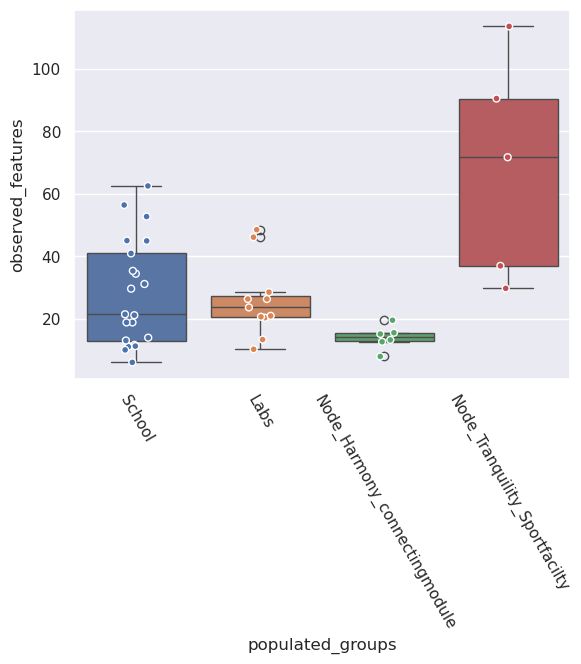

In [101]:
sns.stripplot(data=alpha_merge[alpha_merge['metal'].isin(['brass','copper'])], y="observed_features", x="populated_groups",linewidth=1, edgecolor="White", hue="populated_groups")
sns.boxplot(data=alpha_merge[alpha_merge['metal'].isin(['brass','copper'])], y="observed_features", x="populated_groups", hue="populated_groups")
plt.xticks(rotation=300)

([0, 1, 2, 3],
 [Text(0, 0, 'School'),
  Text(1, 0, 'Labs'),
  Text(2, 0, 'Node_Harmony_connectingmodule'),
  Text(3, 0, 'Node_Tranquility_Sportfacilty')])

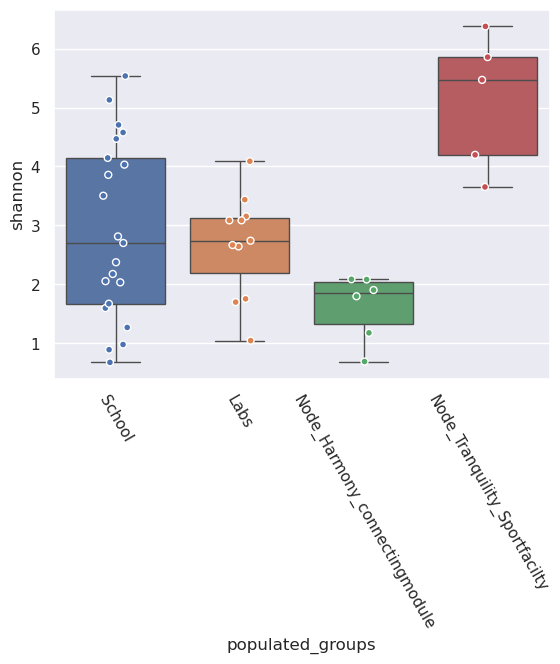

In [102]:
sns.stripplot(data=alpha_merge[alpha_merge['metal'].isin(['brass','copper'])], y="shannon", x="populated_groups",linewidth=1, edgecolor="White", hue="populated_groups")
sns.boxplot(data=alpha_merge[alpha_merge['metal'].isin(['brass','copper'])], y="shannon", x="populated_groups", hue="populated_groups")
plt.xticks(rotation=300)

([0, 1, 2, 3],
 [Text(0, 0, 'School'),
  Text(1, 0, 'Labs'),
  Text(2, 0, 'Node_Harmony_connectingmodule'),
  Text(3, 0, 'Node_Tranquility_Sportfacilty')])

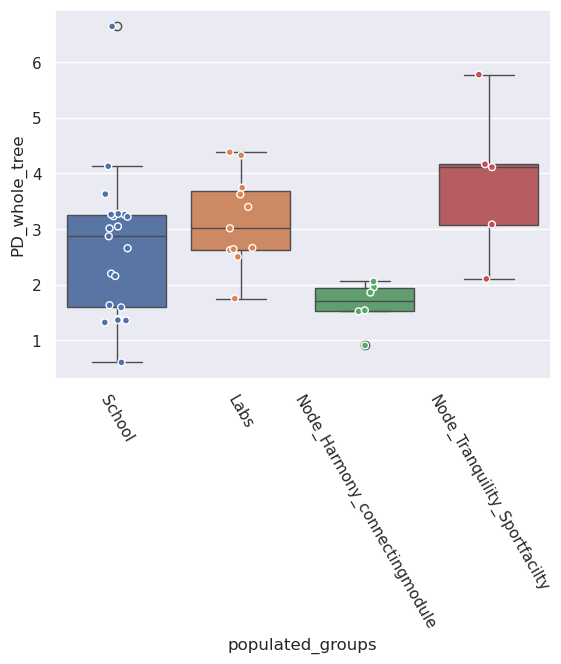

In [103]:
sns.stripplot(data=alpha_merge[alpha_merge['metal'].isin(['brass','copper'])], y="PD_whole_tree", x="populated_groups",linewidth=1, edgecolor="White", hue="populated_groups")
sns.boxplot(data=alpha_merge[alpha_merge['metal'].isin(['brass','copper'])], y="PD_whole_tree", x="populated_groups", hue="populated_groups")
plt.xticks(rotation=300)

# BugBase

In [ ]:
#from statannot import add_stat_annotation
from statannotations.Annotator import Annotator
from skbio.stats.distance import MissingIDError

In [ ]:
res_all['bugbase']

In [ ]:
prj_data['metadata']['metal'].value_counts()

In [ ]:
for cat in res_all['bugbase']['counts']['results']:
    #print(cat)
    plotsum = pd.DataFrame(res_all['bugbase']['counts']['results'][cat].sum()).merge(prj_data['metadata'][prj_data['metadata']['geo_loc_name'].isin(['School','ISS'])], left_index = True , right_index=True, how='left')
    #print(plotsum)
    fig, axs = plt.subplots(figsize=(5, 4))
    sns.boxplot(ax=axs, x="geo_loc_name", hue="metal", y=0, data=plotsum.reset_index(),order=["ISS", "School"]).set_title(cat)
    sns.stripplot(ax=axs, x="geo_loc_name", hue="metal", y=0, data=plotsum.reset_index(), dodge=True, edgecolor="black", linewidth=0.5, order=["ISS", "School"]).set_title(cat)
    box_pairs=[
    (('ISS','steel'),('School', 'steel')),
    (("ISS","brass"), ("School", "brass")),
    (("ISS","copper"), ("School", "copper")),
    (("ISS","aluminum"), ("School", "aluminum")),
    #(('ISS','swab'), ('School', 'swab')),
    #(('ISS','positive_control'), ('ISS', 'positive_control'))
    ]
    annotator = Annotator(axs, box_pairs, data=plotsum.reset_index(), x="geo_loc_name", y=0, hue="metal",order=["ISS", "School"])
    annotator.configure(test='Mann-Whitney', text_format="star", loc="inside")
    annotator.apply_and_annotate()

    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.savefig('/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Anna/Generated/' + f"/bugbase_{cat}.svg", transparent=False, bbox_inches='tight')
    plt.show()

In [ ]:
for cat in res_all['bugbase']['counts']['results']:
    plotsum = pd.DataFrame(res_all['bugbase']['counts']['results'][cat].sum()).merge(prj_data['metadata'][prj_data['metadata']['geo_loc_name'].isin(['School','ISS'])], left_index = True , right_index=True, how='left')
    fig, axs = plt.subplots(figsize=(5, 4))
    sns.boxplot(ax=axs, x="geo_loc_name", hue="metal", y=0, data=plotsum.reset_index()).set_title(cat)
    sns.stripplot(ax=axs, x="geo_loc_name", hue="metal", y=0, data=plotsum.reset_index(), dodge=True, edgecolor="black", linewidth=0.5).set_title(cat)

    box_pairs=[
    (('ISS','steel'), ('ISS', 'aluminum')),
    (('ISS','steel'), ('ISS', 'brass')),
    (('ISS','steel'), ('ISS', 'copper')),
#    (('ISS','steel'), ('ISS', 'swab')),
#    (('ISS','steel'), ('ISS', 'positive_control')),
#    (('ISS','steel'), ('ISS', 'negative_control')),
    (('ISS','aluminum'),('ISS', 'brass')),
    (('ISS','aluminum'), ('ISS', 'copper')),
   # (('ISS','aluminum'), ('ISS', 'swab')),
#    (('ISS','aluminum'), ('ISS', 'positive_control')),
#    (('ISS','aluminum'), ('ISS', 'negative_control')),
    (('ISS','brass'), ('ISS', 'copper')),
   # (('ISS','brass'), ('ISS', 'swab')),
#    (('ISS','brass'), ('ISS', 'positive_control')),
#    (('ISS','brass'), ('ISS', 'negative_control')),
   # (('ISS','copper'), ('ISS', 'swab')),
#    (('ISS','copper'), ('ISS', 'positive_control')),
#    (('ISS','copper'), ('ISS', 'negative_control')),
#    (('ISS','swab'), ('ISS', 'positive_control')),
#    (('ISS','swab'), ('ISS', 'negative_control')),
#    (('ISS','positive_control'), ('ISS', 'negative_control')),
    (('School','steel'), ('School', 'aluminum')),
    (('School','steel'), ('School', 'brass')),
    (('School','steel'), ('School', 'copper')),
    #(('School','steel'), ('School', 'swab')),
#    (('School','steel'), ('School', 'positive_control')),
#    (('School','steel'), ('School', 'negative_control')),
    (('School','aluminum'),('School', 'brass')),
    (('School','aluminum'), ('School', 'copper')),
   # (('School','aluminum'), ('School', 'swab')),
#    (('School','aluminum'), ('School', 'positive_control')),
#    (('School','aluminum'), ('School', 'negative_control')),
    (('School','brass'), ('School', 'copper')),
  #  (('School','brass'), ('School', 'swab')),
#    (('School','brass'), ('School', 'positive_control')),
#    (('School','brass'), ('School', 'negative_control')),
 #   (('School','copper'), ('School', 'swab')),
#    (('School','copper'), ('School', 'positive_control')),
#    (('School','copper'), ('School', 'negative_control')),
#    (('School','swab'), ('School', 'positive_control')),
#    (('School','swab'), ('School', 'negative_control')),
#    (('School','positive_control'), ('School', 'negative_control')),
#    (('ISS','positive_control'), ('ISS', 'positive_control'))

]
    annotator = Annotator(axs, box_pairs, data=plotsum.reset_index(), x="geo_loc_name", y=0, hue="metal",order=["ISS", "School"])
    annotator.configure(test='Mann-Whitney', text_format="star", loc="inside")
    annotator.apply_and_annotate()
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.savefig('/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Anna/Generated/' + f"/bugbase_geolocinternal_{cat}.svg", transparent=False, bbox_inches='tight')
    plt.show()

#### old code:

In [ ]:
for cat in res_all['bugbase']['counts']['results']:
    #print(cat)
    plotsum = pd.DataFrame(res_all['bugbase']['counts']['results'][cat].sum()).merge(prj_data['metadata'][prj_data['metadata']['geo_loc_name'].isin(['School','ISS'])], left_index = True , right_index=True, how='left')
    #print(plotsum)
    fig, axs = plt.subplots(figsize=(5, 4))
    sns.boxplot(ax=axs, x="geo_loc_name", hue="metal", y=0, data=plotsum.reset_index()).set_title(cat)
    sns.stripplot(ax=axs, x="geo_loc_name", hue="metal", y=0, data=plotsum.reset_index(), dodge=True, edgecolor="black", linewidth=0.5).set_title(cat)
    annotation = add_stat_annotation(axs, data=plotsum.reset_index(), x="geo_loc_name", hue="metal", y=0, box_pairs=[
    (('ISS','steel'), ('School', 'steel')),
    (('ISS','brass'), ('School', 'brass')),
    (('ISS','copper'), ('School', 'copper')),
    (('ISS','aluminum'), ('School', 'aluminum')),
  #  (('ISS','swab'), ('School', 'swab')),
#    (('ISS','positive_control'), ('ISS', 'positive_control'))

],test="Mann-Whitney", text_format="star", loc="outside", verbose=2)
    annotation
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.savefig('/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Anna/Generated/' + f"/bugbase_{cat}.svg", transparent=False, bbox_inches='tight')
    plt.show()

In [ ]:
for cat in res_all['bugbase']['counts']['results']:
    plotsum = pd.DataFrame(res_all['bugbase']['counts']['results'][cat].sum()).merge(prj_data['metadata'][prj_data['metadata']['geo_loc_name'].isin(['School','ISS'])], left_index = True , right_index=True, how='left')
    fig, axs = plt.subplots(figsize=(5, 4))
    sns.boxplot(ax=axs, x="geo_loc_name", hue="metal", y=0, data=plotsum.reset_index()).set_title(cat)
    sns.stripplot(ax=axs, x="geo_loc_name", hue="metal", y=0, data=plotsum.reset_index(), dodge=True, edgecolor="black", linewidth=0.5).set_title(cat)
    annotation = add_stat_annotation(axs, data=plotsum.reset_index(), x="geo_loc_name", hue="metal", y=0, box_pairs=[
    (('ISS','steel'), ('ISS', 'aluminum')),
    (('ISS','steel'), ('ISS', 'brass')),
    (('ISS','steel'), ('ISS', 'copper')),
#    (('ISS','steel'), ('ISS', 'swab')),
#    (('ISS','steel'), ('ISS', 'positive_control')),
#    (('ISS','steel'), ('ISS', 'negative_control')),
    (('ISS','aluminum'),('ISS', 'brass')),
    (('ISS','aluminum'), ('ISS', 'copper')),
   # (('ISS','aluminum'), ('ISS', 'swab')),
#    (('ISS','aluminum'), ('ISS', 'positive_control')),
#    (('ISS','aluminum'), ('ISS', 'negative_control')),
    (('ISS','brass'), ('ISS', 'copper')),
   # (('ISS','brass'), ('ISS', 'swab')),
#    (('ISS','brass'), ('ISS', 'positive_control')),
#    (('ISS','brass'), ('ISS', 'negative_control')),
   # (('ISS','copper'), ('ISS', 'swab')),
#    (('ISS','copper'), ('ISS', 'positive_control')),
#    (('ISS','copper'), ('ISS', 'negative_control')),
#    (('ISS','swab'), ('ISS', 'positive_control')),
#    (('ISS','swab'), ('ISS', 'negative_control')),
#    (('ISS','positive_control'), ('ISS', 'negative_control')),
    (('School','steel'), ('School', 'aluminum')),
    (('School','steel'), ('School', 'brass')),
    (('School','steel'), ('School', 'copper')),
    #(('School','steel'), ('School', 'swab')),
#    (('School','steel'), ('School', 'positive_control')),
#    (('School','steel'), ('School', 'negative_control')),
    (('School','aluminum'),('School', 'brass')),
    (('School','aluminum'), ('School', 'copper')),
   # (('School','aluminum'), ('School', 'swab')),
#    (('School','aluminum'), ('School', 'positive_control')),
#    (('School','aluminum'), ('School', 'negative_control')),
    (('School','brass'), ('School', 'copper')),
  #  (('School','brass'), ('School', 'swab')),
#    (('School','brass'), ('School', 'positive_control')),
#    (('School','brass'), ('School', 'negative_control')),
 #   (('School','copper'), ('School', 'swab')),
#    (('School','copper'), ('School', 'positive_control')),
#    (('School','copper'), ('School', 'negative_control')),
#    (('School','swab'), ('School', 'positive_control')),
#    (('School','swab'), ('School', 'negative_control')),
#    (('School','positive_control'), ('School', 'negative_control')),
#    (('ISS','positive_control'), ('ISS', 'positive_control'))

],test="Mann-Whitney", text_format="star", loc="outside", verbose=2)
    annotation
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
    plt.savefig('/vol/jlab/MicrobiomeAnalyses/Projects/Kraemer_TouchingSurfaces/Anna/Generated/' + f"/bugbase_geolocinternal_{cat}.svg", transparent=False, bbox_inches='tight')
    plt.show()